In [1]:
%load_ext autoreload
%autoreload 2
%env CUDA_VISIBLE_DEVICES=[]

env: CUDA_VISIBLE_DEVICES=[]


### Corn crake vocalization

Source:
- https://link.springer.com/article/10.1007/s10336-017-1438-7
- http://www.tierstimmenarchiv.de/webinterface/contents/treebrowser.php

- Vocalizations are segmented into something like phrases
- each foreground file has (should have) a corresponding background file that can potentially be used for noise reduction

In [2]:
from pathlib2 import Path
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import re
import IPython
import librosa

In [3]:
from avgn_paper.signalprocessing import spectrogramming as sg

In [4]:
import pdb
from joblib import Parallel, delayed
n_jobs = 10
verbosity = 5

In [5]:
from tqdm.autonotebook import tqdm
from librosa.core.time_frequency import mel_frequencies
from avgn_paper.signalprocessing.spectrogramming_tf import spectrogram_tensorflow
from avgn_paper.utils.audio import load_wav, float32_to_int16, int16_to_float32, write_wav
from avgn_paper.visualization.spectrogram import visualize_spec, plot_spec
from avgn_paper.utils.general import HParams
from avgn_paper.signalprocessing.filtering import butter_bandpass_filter

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


### data locations

In [6]:
from glob import glob

In [7]:
DSLOC = Path('/mnt/cube/Datasets/animalsoundarchive/crex_crex/')

In [51]:
fg_list = list(DSLOC.glob('*.mp3'))
len(fg_list), np.sort(fg_list)[-5:]

(233,
 array([PosixPath('/mnt/cube/Datasets/animalsoundarchive/crex_crex/Crex_crex_89582_short.mp3'),
        PosixPath('/mnt/cube/Datasets/animalsoundarchive/crex_crex/Crex_crex_89583_short.mp3'),
        PosixPath('/mnt/cube/Datasets/animalsoundarchive/crex_crex/Crex_crex_89584_short.mp3'),
        PosixPath('/mnt/cube/Datasets/animalsoundarchive/crex_crex/Crex_crex_89585_short.mp3'),
        PosixPath('/mnt/cube/Datasets/animalsoundarchive/crex_crex/Crex_crex_89586_short.mp3')],
       dtype=object))

In [24]:
vocalization_lib = pd.read_csv(DSLOC.parent / 'recording_df.csv')
voc_df = vocalization_lib[(vocalization_lib.species == 'Crex crex')  & (vocalization_lib.author == 'Budka, Michal')]


In [26]:
voc_df = voc_df[
    [
        "filename",
        "species",
        "latitude",
        "longitude",
        "altitude",
        "recording_date",
        "recording_time",
        "sex",
        "age",
        "sound_type",
        "collection",
        "filename_ext",
        "description",
        "duration",
        "notes",
        "unique_identifier",
        "bytes",
        "recording_type",
        "recording_equipment",
        "notes"
    ]
]

In [27]:
voc_df[:3]

,filename,species,latitude,longitude,altitude,recording_date,recording_time,sex,age,sound_type,collection,filename_ext,description,duration,notes,unique_identifier,bytes,recording_type,recording_equipment,notes
7401,Crex_crex_89354,Crex crex,49.30593,22.03909,531.0,8.6.2011,22:09,male,adult,song,J_Orn,Crex_crex_89354_short.mp3,Song of corncrake. Recording used in Budka M. ...,00:00:29,NaN,J_Orn:Crex_crex_89354,471000.0,w,"Marantz PMD 620, Sennheiser ME 67",NaN
7402,Crex_crex_89355,Crex crex,49.30919,22.03963,550.0,8.6.2011,22:55,male,adult,song,J_Orn,Crex_crex_89355_short.mp3,Song of corncrake. Recording used in Budka M. ...,00:00:25,NaN,J_Orn:Crex_crex_89355,395000.0,w,"Marantz PMD 620, Sennheiser ME 67",NaN
7403,Crex_crex_89356,Crex crex,49.30871,22.05282,553.0,8.6.2011,23:51,male,adult,song,J_Orn,Crex_crex_89356_short.mp3,Song of corncrake. Recording used in Budka M. ...,00:00:25,NaN,J_Orn:Crex_crex_89356,405000.0,w,"Marantz PMD 620, Sennheiser ME 67",NaN


In [67]:
voc_df.sex.unique(), voc_df.age.unique(),  voc_df.sound_type.unique()

(array(['male'], dtype=object),
 array(['adult'], dtype=object),
 array(['song'], dtype=object))

In [30]:
voc_df.description.values[0]

'Song of corncrake. Recording used in Budka M. & T.S. Osiejuk (2017): Microgeographic call variation in a non-learning species, the Corncrake (Crex crex). Journal of Ornithology, 158(3): 651-658.'

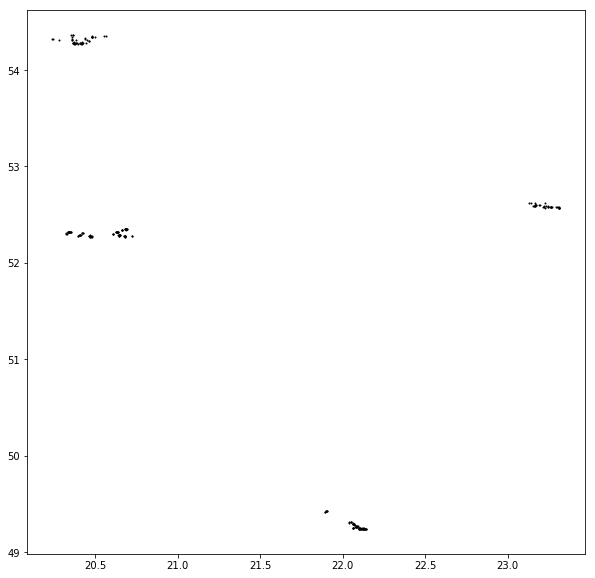

In [38]:
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(voc_df.longitude, voc_df.latitude, s=1, alpha =1, color='k')

In [56]:
def prepare_mel_matrix(hparams, return_numpy=True):
    # create a filter to convolve with the spectrogram
    mel_matrix = tf.signal.linear_to_mel_weight_matrix(
        num_mel_bins=hparams.num_mel_bins,
        num_spectrogram_bins=int(hparams.n_fft / 2) + 1,
        sample_rate=rate,
        lower_edge_hertz=hparams.mel_lower_edge_hertz,
        upper_edge_hertz=hparams.mel_upper_edge_hertz,
        dtype=tf.dtypes.float32,
        name=None,
    )
    
    # gets the center frequencies of mel bands
    mel_f = mel_frequencies(
        n_mels=hparams.num_mel_bins + 2,
        fmin=hparams.mel_lower_edge_hertz,
        fmax=hparams.mel_upper_edge_hertz,
    )

    # Slaney-style mel is scaled to be approx constant energy per channel (from librosa)
    enorm = tf.dtypes.cast(
        tf.expand_dims(
            tf.constant(
                2.0 / (mel_f[2 : hparams.num_mel_bins + 2] - mel_f[: hparams.num_mel_bins])
            ),
            0,
        ),
        tf.float32,
    )

    mel_matrix = tf.multiply(mel_matrix, enorm)
    mel_matrix = tf.divide(mel_matrix, tf.reduce_sum(mel_matrix, axis=0))
    if return_numpy:
        return mel_matrix.numpy()
    else:
        return mel_matrix
    
rate = 22050
win_length_ms = 10
hop_length_ms = 2
print(win_length_ms / 1000 * rate)
print(hop_length_ms / 1000 * rate)

hparams = HParams(
    # spectrogramming
    win_length=int(rate / 1000 * win_length_ms),
    n_fft=1024,
    hop_length=int(rate / 1000 * hop_length_ms),
    ref_level_db=20,
    min_level_db=-40,
    preemphasis=0.97,
    # mel scaling
    num_mel_bins=64,
    mel_lower_edge_hertz=1000,
    mel_upper_edge_hertz=11024,
    # inversion
    power=1.5,  # for spectral inversion
    griffin_lim_iters=50,
    pad=True,
    #
)
mel_matrix = prepare_mel_matrix(hparams)

220.5
44.1


In [57]:
import warnings
warnings.filterwarnings('ignore')

In [58]:
row.filename_ext

'Crex_crex_89358_short.mp3'

In [59]:
row.filename_ext

'Crex_crex_89358_short.mp3'

In [62]:
row.sex

filename                                                 Crex_crex_89367
species                                                        Crex crex
latitude                                                         49.2645
longitude                                                        22.0808
altitude                                                             574
recording_date                                                 12.6.2011
recording_time                                                     02:21
sex                                                                 male
age                                                                adult
sound_type                                                          song
collection                                                         J_Orn
filename_ext                                   Crex_crex_89367_short.mp3
description            Song of corncrake. Recording used in Budka M. ...
duration                                           

'song'

song male adult 531.0 49.30593 22.03909


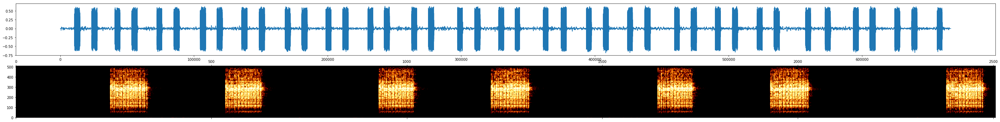

song male adult 550.0 49.30919 22.03963


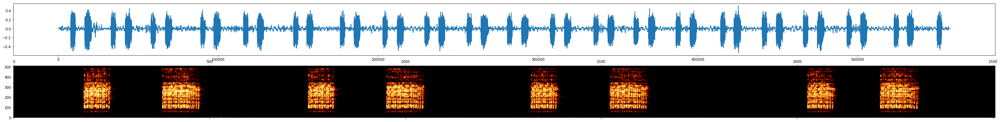

song male adult 553.0 49.30871 22.05282


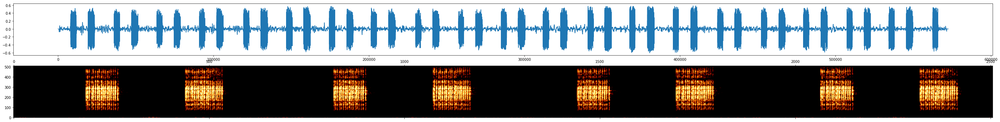

song male adult 565.0 49.31088 22.05167


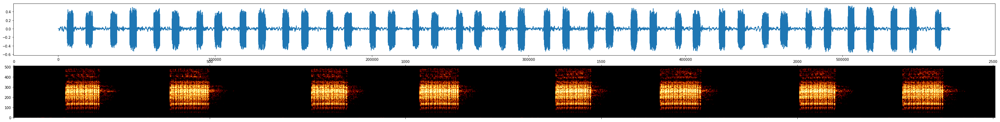

song male adult 578.0 49.31223 22.05072


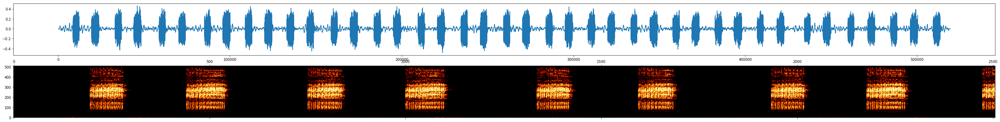

song male adult 567.0 49.28753 22.06212


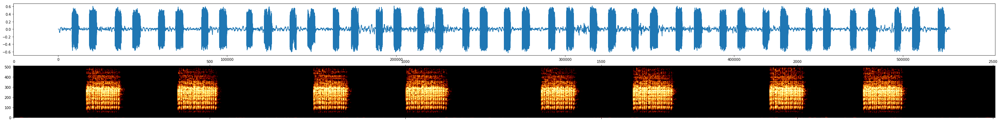

song male adult 534.0 49.28332 22.07571


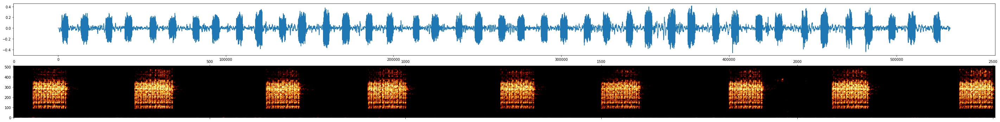

song male adult 573.0 49.2887 22.06755


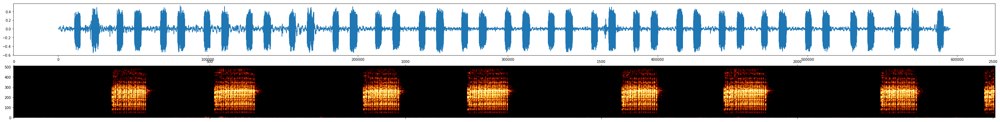

song male adult 570.0 49.28728 22.06238


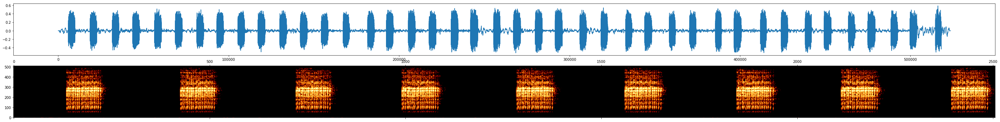

song male adult 560.0 49.28835 22.06098


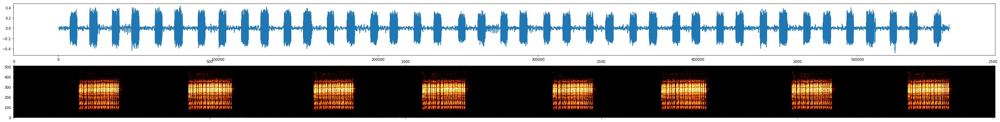

song male adult 568.0 49.28594 22.06345


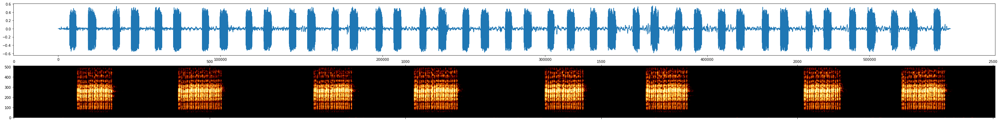

song male adult 575.0 49.26146 22.08385


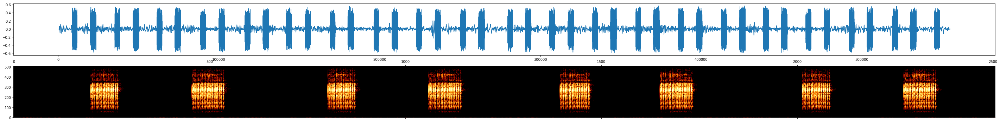

song male adult 572.0 49.26264000000001 22.08284


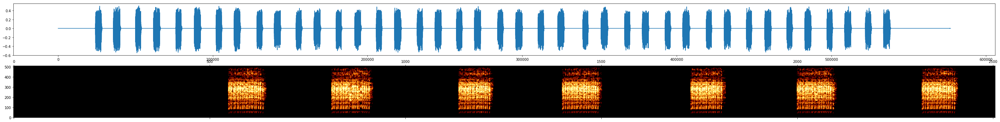

song male adult 574.0 49.26446 22.080820000000006


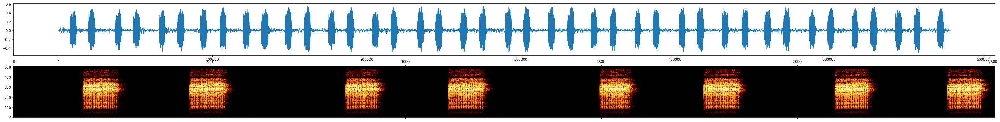

song male adult 614.0 49.26369 22.074720000000006


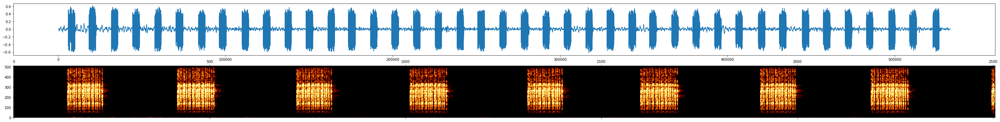

song male adult 583.0 49.26347 22.07979


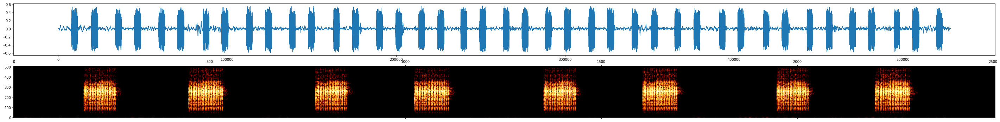

song male adult 593.0 49.2696 22.08422


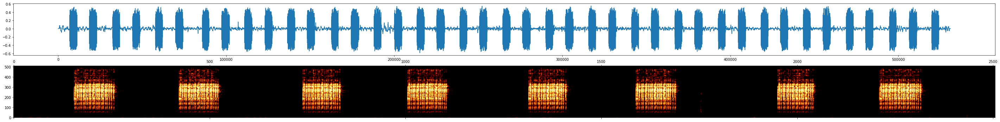

song male adult 586.0 49.27188 22.08289


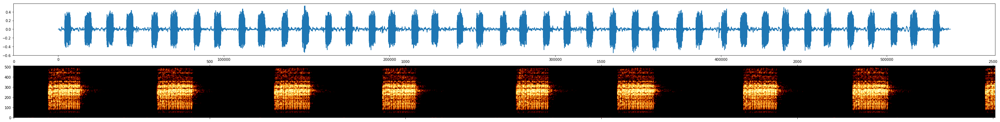

song male adult 575.0 49.26715 22.08755


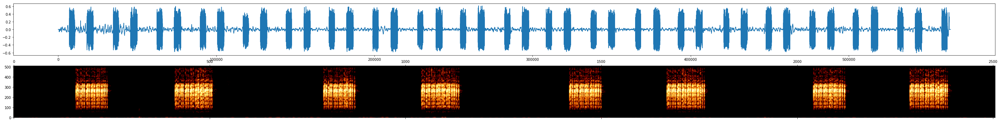

song male adult 576.0 49.26644 22.09034


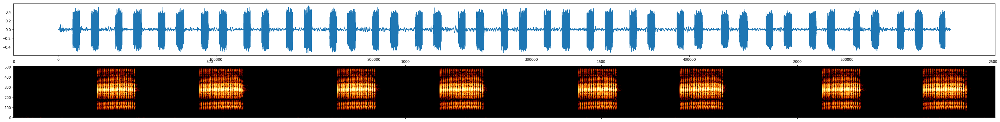

song male adult 564.0 49.26218 22.08512


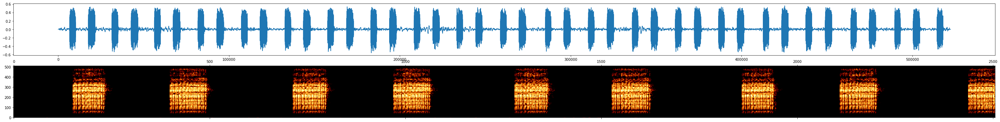

song male adult 547.0 49.24314 22.102


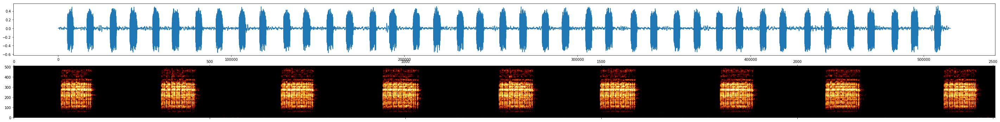

song male adult 554.0 49.24535 22.09842


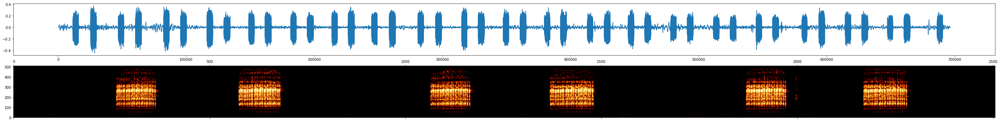

song male adult 585.0 49.25285 22.099120000000006


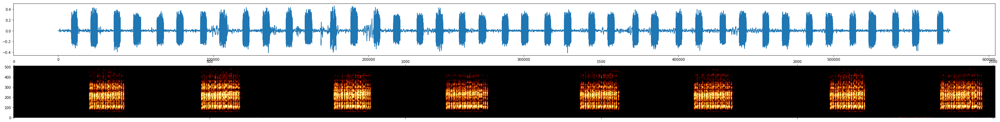

song male adult 600.0 49.24675 22.06248


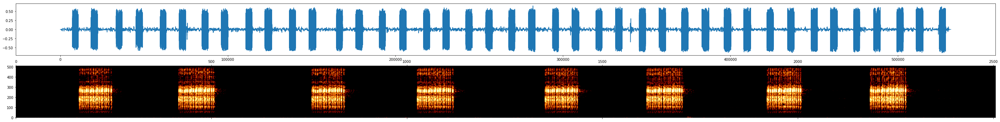

song male adult 608.0 49.24598 22.06509


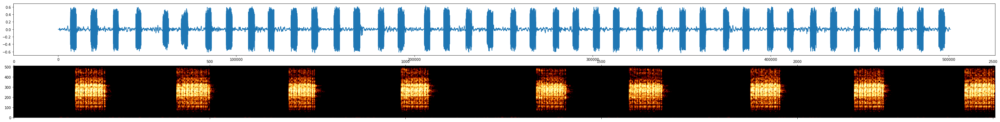

song male adult 619.0 49.24709 22.06408


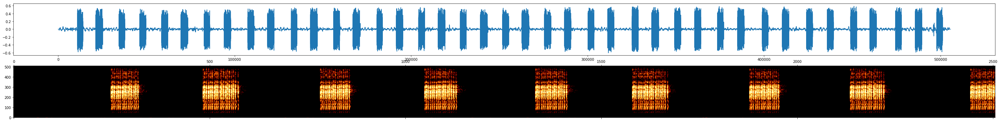

song male adult 632.0 49.24758 22.0649


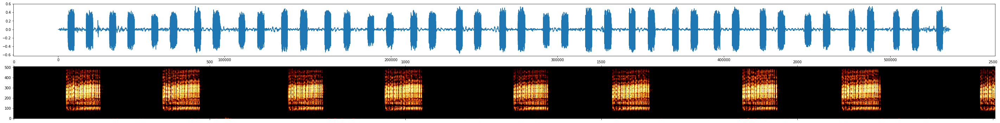

song male adult 529.0 49.24267 22.10952


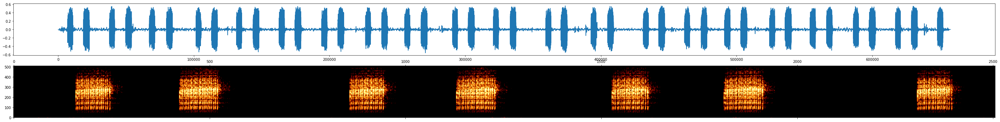

song male adult 532.0 49.24174 22.10796


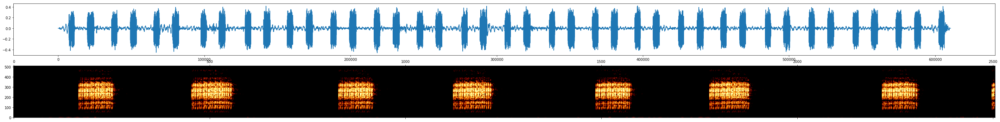

song male adult 537.0 49.24133 22.10564


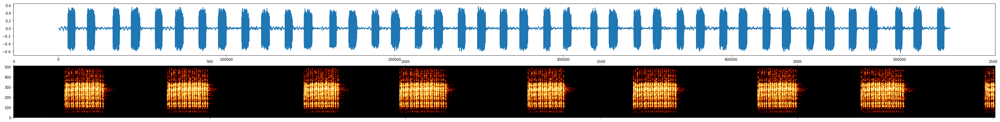

song male adult 548.0 49.24612 22.11991


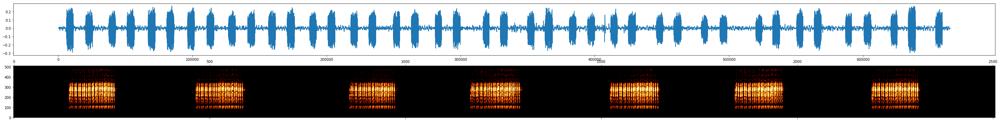

song male adult 546.0 49.24128 22.13901


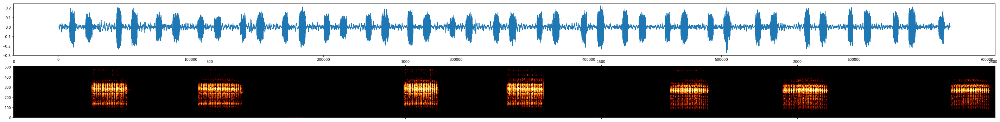

song male adult 542.0 49.23981 22.14035


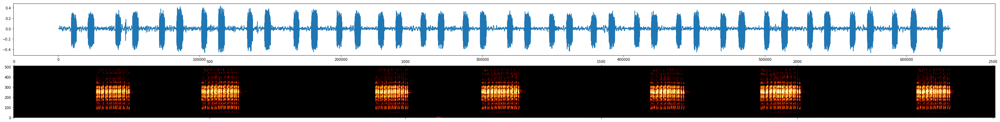

song male adult 542.0 49.24017 22.13989


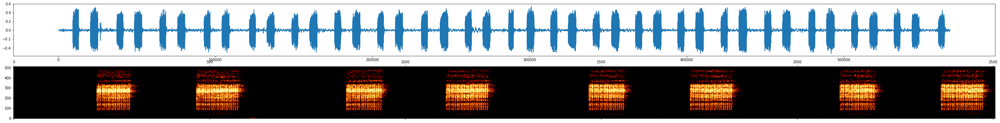

song male adult 534.0 49.24313 22.13525


KeyboardInterrupt: 

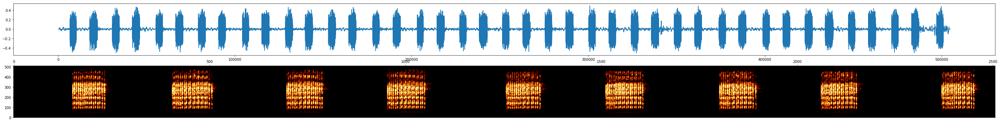

In [64]:
for idx, row in tqdm(voc_df.iterrows()):
    print(row.sound_type, row.sex, row.age, row.altitude, row.latitude, row.longitude)
    mp3_path = np.array(fg_list)[row.filename_ext == np.array([i.name for i in fg_list])][0]
    y, sr = librosa.load(mp3_path)
    spectrogram = sg.spectrogram(y[:sr*5], hparams)
    
    fig, axs = plt.subplots(nrows=2, figsize=(50,6))
    axs[0].plot(y)
    axs[1].matshow(spectrogram, origin='lower', aspect='auto', cmap = plt.cm.afmhot)
    plt.show()
    